# 2.155/6 Challenge Problem 2
<font size="1">
  Demo created by L. Regenwetter in Oct. 2023;   Artwork by Jessica Shung. </font>

In [1]:
from utils_public import *
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import autogluon
from autogluon.tabular import TabularPredictor
import os

c:\Users\layal\anaconda3\envs\cp2env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# !pip install scikit-learn
# !conda install matplotlib
# !pip install autogluon && pip install autogluon.tabular[tabpfn,vowpalwabbit,imodels,skex,skl2onnx]
# !pip uninstall scipy

# Overview
In this challenge problem, you've been hired as an urban planner for an urban development project in budding city. The city is rapidly expanding and has a large area that they are looking to zone. The mayor has asked you to consult with several of their advisors to figure out an optimal zoning strategy. These advisors are an interesting bunch. Though they mean well, but they are somewhat biased towards their own areas of expertise. Pleasing all of them will be tricky!

## Let's meet the advisors:
**The Wellness Advisor:** With a background in the parks & rec department of the city government, the wellness advisor is focused on the health and wellbeing (both physical and mental) of citizens. Among other things, they are very invested in the quality and accessibility of city's green spaces.

**The Tax Advisor:** With a background in the revenue department of the city government, the tax advisor is focused on balancing city expenditures with income and keeping the city's economy afloat. Among other things, they are invested in maximizing property value and reducing city expenditures.  

**The Transportation Advisor**: As a former executive in the local public transportation authority, the transportation advisor places an emphasis on accessibility and emissions. Among other objectives, they are focused on mimizing the distance over which the workforce needs to commute.

**The Business advisor:** As a professor emeritus of economics at the state college in the city, the economic advisor is fixated on the general economic prosperity of the city's businesses and inhabitants. Among other things, they prioritize the overall economic output of the city.

## Understanding City Zoning:
Cities are often comprised of districts. Typically, the city government zones areas allowing them some amount of control over what goes on in each distict. To simplify, we will be represing city districts as discrete spaces in a 7x7 grid. Each grid space will be filled with exactly one of five types of zones. We will discuss the districts below:

**Residential Zones [0]:** Residential zones are comprised primarily of housing and are where the workforce lives

**Industrial Zones [1]:** Industrial zones are the manufacturing centers of the city, packed with factories producing food and goods.

**Commercial Zones [2]:** Commercial zones are the retail hubs of the city, consisting of markets, stores, and restaurants.

**Park Zones [3]:** City parks are the green spaces of the city -- small tastes of nature within an urban environment.

**Office Zones [4]:** Office zones are the enterprise centers of global corporations and local businesses alike.

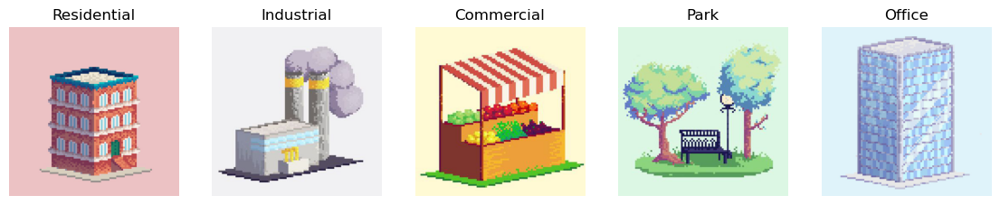

In [4]:
plot_districts()

## The Data
The mayor has provided you access to a large dataset of 500,000 possible zoning configurations. Additionally, the mayor asked the advisors to score some of these zoning configurations according to their subjective opinions of efficacy. Since the advisors are "only human" they have only been able to label ~5,000 configurations each. Some of their assessments may seem questionable to you, but they mayor insists that the advisors are "experts" and their ratings should not be questioned.

Let's take a look at the data. First, lets have a look at the zoning layouts you are given.

In [5]:
grids = load_grids() #Helper function we have provided to load the grids from the dataset
grids.shape #Check shape

(500000, 7, 7)

Let's examine the first grid in the dataset. It consists of 7x7 entries, each ranging from 0 to 4. The entries denote the district occupying the grid space (labeled above).

In [6]:
grids[0]

array([[4., 3., 0., 2., 3., 4., 4.],
       [0., 2., 0., 4., 3., 0., 3.],
       [4., 1., 0., 0., 1., 0., 3.],
       [2., 1., 2., 1., 3., 1., 1.],
       [2., 2., 2., 2., 4., 2., 3.],
       [2., 0., 0., 2., 0., 1., 0.],
       [4., 2., 4., 1., 3., 2., 4.]])

Let's visualize some of these grids. We have provided some utilities, mainly fucused on visualization, which we imported at the top of the notebook.

<Figure size 640x480 with 0 Axes>

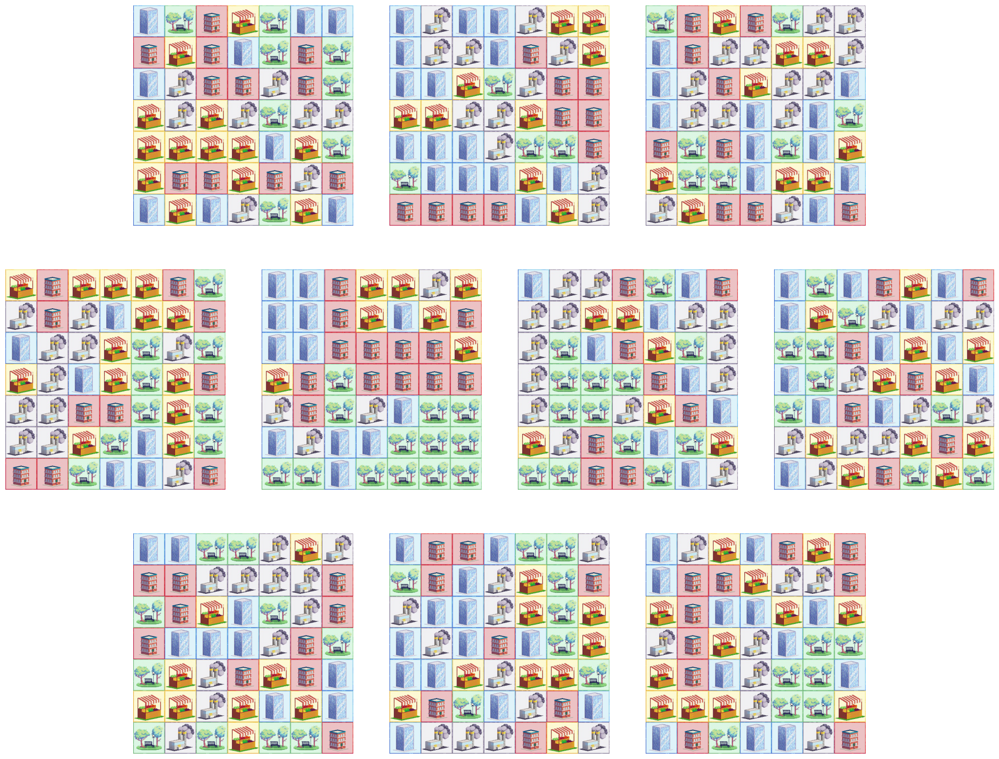

In [7]:
plot_n_grids(grids[:10]) #Plotting function that plots some number of grids in a clean layout

Now lets have a look at the advisor scores:

In [8]:
ratings = np.load("datasets/scores.npy") #Load advisor scores
score_order = ["Wellness", "Tax", "Transportation", "Business"] #This is the order of the scores in the dataset
ratings_df = pd.DataFrame(ratings, columns = score_order) #Create a dataframe
display(ratings_df) #Print dataframe

,Wellness,Tax,Transportation,Business
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN
...,...,...,...,...
499995,NaN,NaN,NaN,NaN
499996,NaN,NaN,NaN,NaN
499997,NaN,NaN,NaN,NaN
499998,NaN,NaN,NaN,NaN


We can see that the vast majority of ratings are NaN. After all, only 1% of the data is labeled. Let's confirm that there are the right number of NaNs in each column:

In [9]:
ratings_df.isna().sum()

Wellness          495001
Tax               495002
Transportation    495001
Business          495000
dtype: int64

Let's plot the distribution over the scores that are rated. We see that each advisor's scores are fairly uniform from 0 to 1.

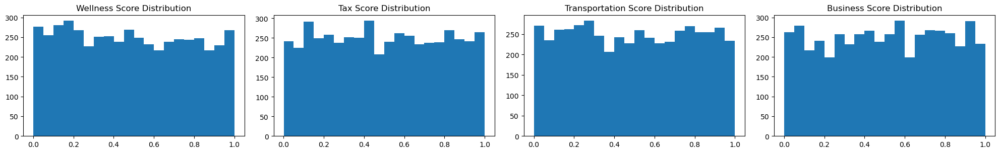

In [10]:
plot_ratings_histogram(ratings)

## The Task:
**Satisfying the Advisors:**
You are tasked with finding zoning layouts that "satisfy" all four advisors, meaning that they each assign a score of at least 0.85. If even one of the advisors rates a layout under a 0.85, it will be rejected as a candidate. You much identify designs from the dataset or generate new designs that *you believe* will be accepted by the advisors.

**Identifying a diverse set:** The mayor has asked for a variety of "diverse" design candidates -- 100 city layouts to be exact -- which they will show to the advisors. The overall diversity of all valid (non-rejected) designs will be calculated. With this diversity metric, more designs is always better, so it is in your best interest to ensure that as few of your submitted designs are rejected as possible.

We have provided the function we will use to evaluate diversity. Here are a few tests to build some intuition with the diversity score.

### Building Intuition for Diversity

In [11]:
diversity_score(grids[:100]) #Diversity of the first 100 grids in the dataset

0.7989527932385075

In [12]:
#If we set the top left corner to 0 in all grids, the diversity score should go down
g_1 = grids.copy()
g_1[:,0,0] = 0
diversity_score(g_1[:100])

0.78281179138322

In [13]:
#If some grids are the same, the diversity score should go down
g_2 = grids.copy()
g_2[0] = g_2[1]
diversity_score(g_2[:100])

0.798726035868893

In [14]:
#If we submit fewer grids, the diversity score should go down (as will occur if invalid designs are submitted)
diversity_score(g_2[:99]) #Diversity of the first 99 grids in the dataset

0.7826509997938569

<Figure size 640x480 with 0 Axes>

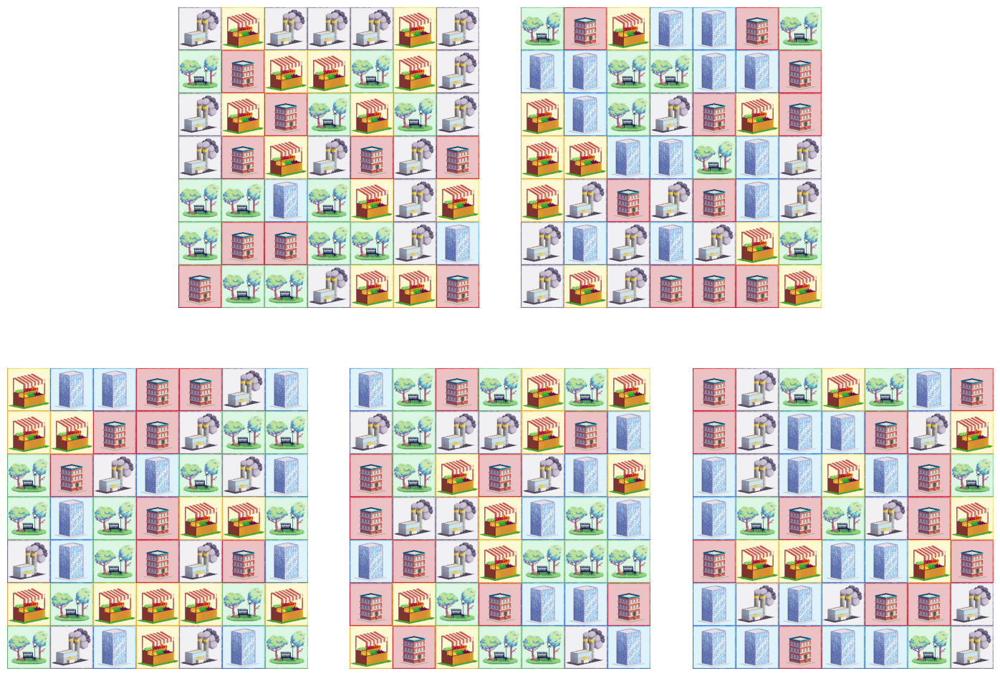

Diversity Score: 1.0


In [15]:
# A diverse set of five grids where no two cities have the same type of district in the same grid space
diverse_set = np.random.rand(5,7,7).argsort(0)
plot_n_grids(diverse_set)
print(f"Diversity Score: {diversity_score(diverse_set, 5)}")


<Figure size 640x480 with 0 Axes>

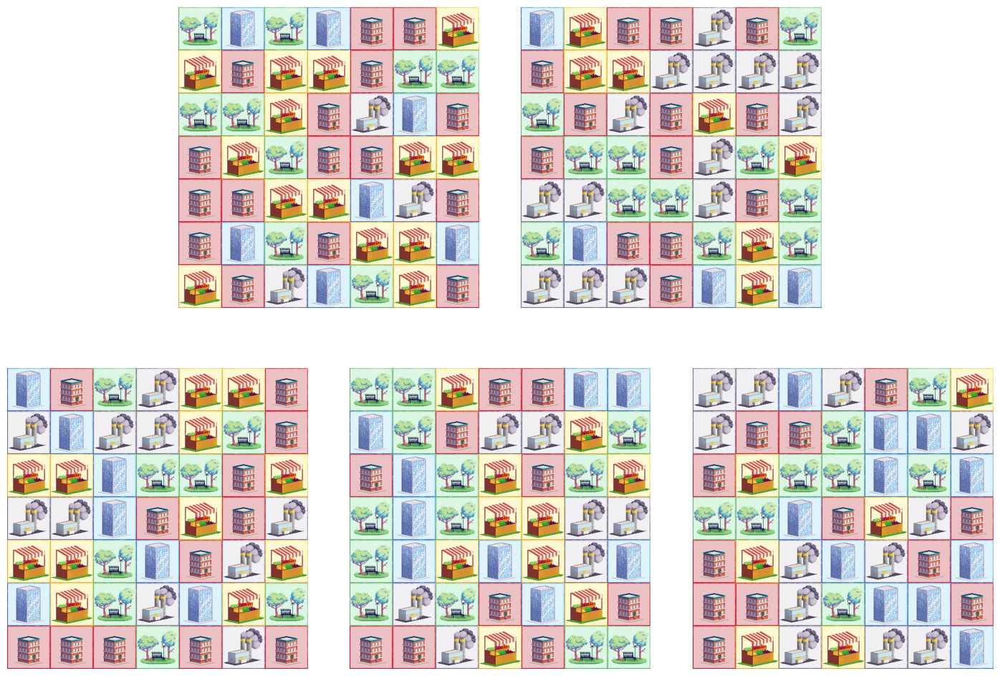

Diversity Score: 0.7959183673469388


In [16]:
#set of 5 grids where each district is independent and random with 20% probability for each district
random_set = np.random.randint(0,5, size=(5,7,7))
plot_n_grids(random_set)
print(f"Diversity Score: {diversity_score(random_set, 5)}")

<Figure size 640x480 with 0 Axes>

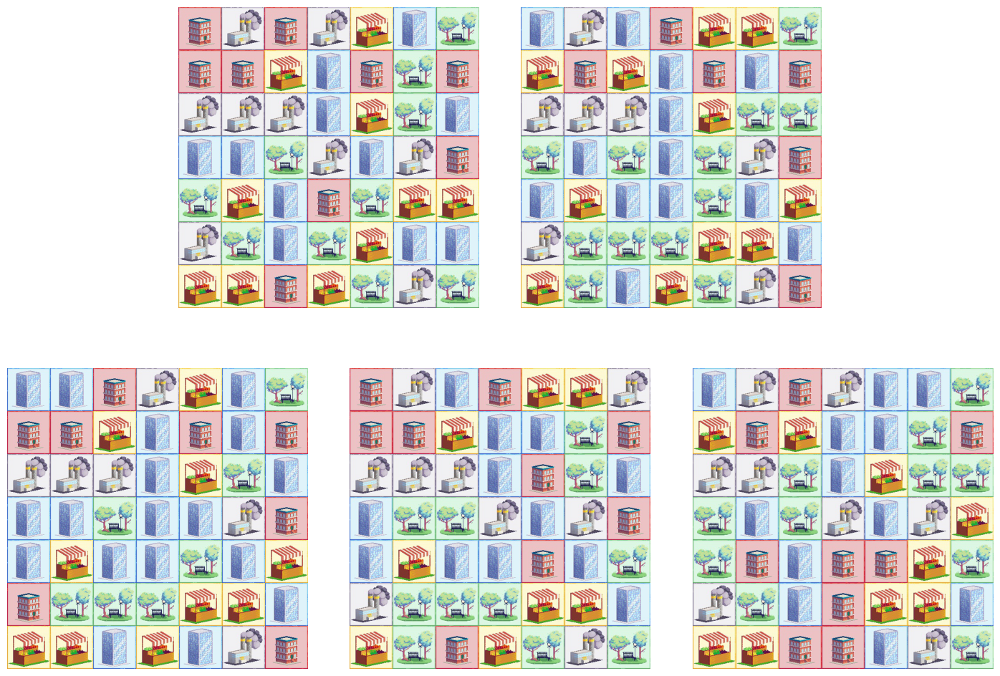

Diversity Score: 0.3510204081632653


In [17]:
#Set of five grids where each grid space only takes one of two types across all cities
r1 = np.random.randint(0,5,size=(7,7))
r2 = np.random.randint(0,5,size=(7,7))
mask = np.random.randint(0,2,size=(5,7,7))
non_diverse_set = r1 * mask + r2 * (1-mask)
plot_n_grids(non_diverse_set)
print(f"Diversity Score: {diversity_score(non_diverse_set, 5)}")

Assuming that all designs in your submitted sets are valid, you will be able to *exactly calculate* the diversity of your submitted sets.

# Your Code

Time to get coding! We recommend you start by training some regressors to predict the advisor scores. From there, it's up to you to generate or select city designs that you think will satisfy the requirements!



### Hints:
1. The advisors pay a lot of attention to the **adjacency** of districts as well as the **distances** from certain types of districts to others.
2. This is a grid-structured city. What **distance metric** is appropriate?
3. Though adding **novel** varied designs to your final set will increase the diversity score most, **duplicates** of valid designs will still slightly increase the diversity score, whereas invalid designs will not (see utils function for exact calculation).



### Training Regressors
We have provided code to train a simple AutoML regressor from AutoGluon that predicts advisor scores.


First, lets install autogluon:

We provided a small helper function that grabs the labeled subset of the dataset for some advisor:

In [18]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,0]) #gets subset of the dataset rated by advisor 0
print(grids_subset.shape)
print(ratings_subset.shape)

(4999, 7, 7)
(4999,)


We will be using Autogluon Tabular, which requires flattened (tabular) data. Let's reshape our grids:

In [19]:
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49) #Flatten our nx7x7 set of grids into nx49 set of vectors

Autogluon is time-consuming so we aren't going to bother with k-fold here. We do a simple train-test split to save time. Autogluon expects a single dataframe with both the "x" and "y" values and asks the user to specify the name of the column to predict. Therefore, we set up a dataframe with the predictions and the flattened feature vectors side by side:

In [20]:
grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

#Convert to dataframe and specify dtype of object to ensure categorical handling of data
grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object")
grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")

#Convert ratings to dataframe and label the column so we can tell Autogluon what to predict
preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])

#Concatenate train grids and ratings together
all_train = pd.concat([grids_train, preds_train], axis=1)
display(all_train) #Have a look to check things over

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,ratings
0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,1.0,3.0,2.0,...,3.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,0.671171
1,2.0,3.0,1.0,4.0,3.0,3.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,0.0,0.008008
2,0.0,1.0,2.0,4.0,0.0,3.0,2.0,3.0,2.0,3.0,...,0.0,1.0,2.0,3.0,2.0,4.0,3.0,2.0,1.0,0.427928
3,3.0,0.0,4.0,1.0,1.0,2.0,0.0,2.0,1.0,4.0,...,0.0,4.0,2.0,1.0,2.0,1.0,3.0,1.0,0.0,0.153153
4,0.0,4.0,4.0,2.0,0.0,2.0,4.0,4.0,1.0,3.0,...,2.0,4.0,2.0,4.0,0.0,1.0,0.0,3.0,3.0,0.212713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3744,2.0,2.0,0.0,2.0,4.0,2.0,2.0,0.0,1.0,0.0,...,0.0,4.0,1.0,4.0,0.0,1.0,2.0,2.0,1.0,0.024841
3745,2.0,2.0,4.0,4.0,1.0,4.0,2.0,0.0,2.0,2.0,...,2.0,4.0,4.0,3.0,2.0,4.0,0.0,1.0,4.0,0.311311
3746,4.0,4.0,0.0,3.0,3.0,1.0,0.0,1.0,1.0,1.0,...,4.0,3.0,4.0,0.0,4.0,0.0,3.0,4.0,2.0,0.537037
3747,1.0,4.0,4.0,1.0,1.0,1.0,1.0,1.0,4.0,3.0,...,3.0,3.0,0.0,0.0,3.0,3.0,2.0,2.0,3.0,0.957457


We finally train the model! (Please don't waste too much time fiddling with Autogluon parameters -- the whole point of AutoML is to avoid this!)

In [21]:
predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {'NN_TORCH':{}, 'GBM':{}, 'RF':{}, 'XT':{}, 'KNN':{}})

No path specified. Models will be saved in: "AutogluonModels\ag-20231106_183834\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_183834\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   25.12 GB / 510.77 GB (4.9%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.48599, 0.2909)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

In [21]:
from sklearn.metrics import r2_score

preds_test = predictor.predict(grids_test)
preds_train = predictor.predict(grids_train)

def plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i):
    plt.scatter(ratings_train, preds_train, label='Train Set Preds', s=3, c = "#F08E18") #Train set in orange
    plt.scatter(ratings_test, preds_test, label='Test Set Preds', s=5, c = "#DC267F") #Test set in magenta
    plt.plot([0,1], [0,1], label="target", linewidth=3, c="k") # Target line in Black
    plt.xlabel("Actual Rating")
    plt.ylabel("Predicted Rating")
    plt.title(f"Advisor {i} Predictions")
    plt.legend()
    plt.show()
    print(f"Train Set R2 score: {r2_score(ratings_train, preds_train)}") #Calculate R2 score
    print(f"Test Set R2 score: {r2_score(ratings_test, preds_test)}")
plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, 0)

AttributeError: 'Net' object has no attribute 'predict'

A little function to get all the predictions for the dataset, but overwrite the prediction for the datapoints where the ground truth value is known.

In [23]:
def get_predictions(grids, ratings, predictor):
    grids = grids.reshape(grids.shape[0], 49)
    grids_df = pd.DataFrame(grids, columns = range(grids.shape[1]))
    predictions = predictor.predict(grids_df).values
    mask = np.where(~np.isnan(ratings))
    predictions[mask] = ratings[mask]
    return predictions
predictions = get_predictions(grids, ratings[:,0], predictor)


In [24]:
predictions.shape

(500000,)

Let's compile all of that into a single functon then loop over the four advisors to get a set of predictions for all of them:

In [25]:
#use autogluon to 
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {'NN_TORCH':{}, 'GBM':{}, 'RF':{}, 'XT':{}, 'KNN':{}})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

### Preds for all

No path specified. Models will be saved in: "AutogluonModels\ag-20231106_183939\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_183939\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.97 GB / 510.77 GB (4.9%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.999769053117783, 0.000898500117417629, 0.5015, 0.2896)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Avai

	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	2.5s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train Data (Processed) Memory Usage: 0.2 MB (0.0% of available memory)
Data preprocessing and feature engineering runtime = 2.61s ...
AutoGluon will gauge predictive performance using evaluation metric: 'root_mean_squared_error'
	This metric's sign has been flipped to adhere to being higher_is_better. The

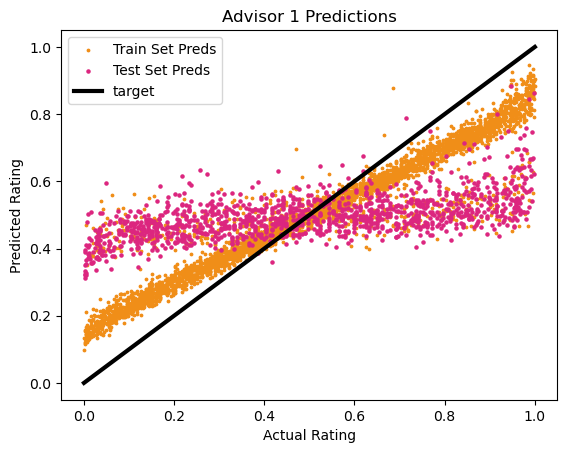

Train Set R2 score: 0.8022840743373466
Test Set R2 score: 0.22051244954251947


No path specified. Models will be saved in: "AutogluonModels\ag-20231106_184021\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_184021\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.81 GB / 510.77 GB (4.9%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9992992992992994, 0.000642515014272003, 0.49915, 0.28937)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	A

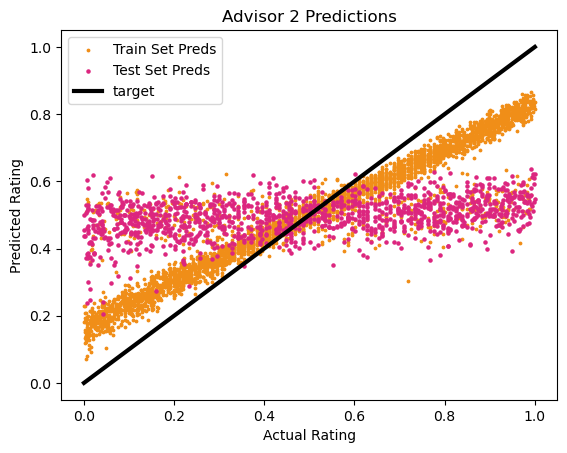

Train Set R2 score: 0.7756737012511536
Test Set R2 score: 0.1031323389329516


No path specified. Models will be saved in: "AutogluonModels\ag-20231106_184100\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231106_184100\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   24.66 GB / 510.77 GB (4.8%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0005841214972714321, 0.50519, 0.28978)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	

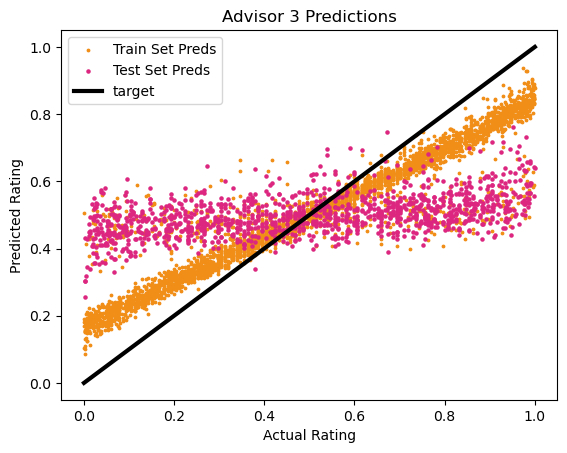

Train Set R2 score: 0.792000020755913
Test Set R2 score: 0.16121235820554924


In [26]:
all_predictions = [predictions]
all_predictors = [predictor]
for i in range(1,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

We stack the predictions together and identify the lowest advisor score for each design. According to the regressors in the starting notebook, it's quite possible that none of the designs in the dataset are predicted to satisfy all four advisors with scores above 0.9 across the board. This is a problem! Despite this, we indentify the 100 designs with the highest minimum score and submit those.

In [27]:
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.6653603  0.69608545 0.9494494  0.63742894]


We visualize the score histograms and the grids of the top 10 designs.

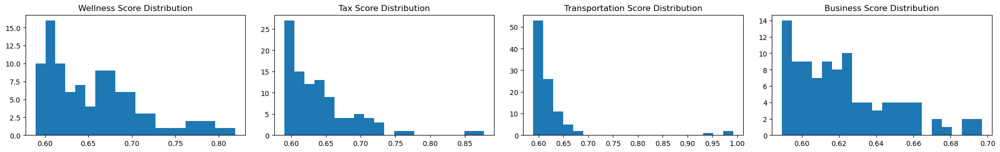

In [28]:
plot_ratings_histogram(final_prediction_array[top_100_indices])

<Figure size 640x480 with 0 Axes>

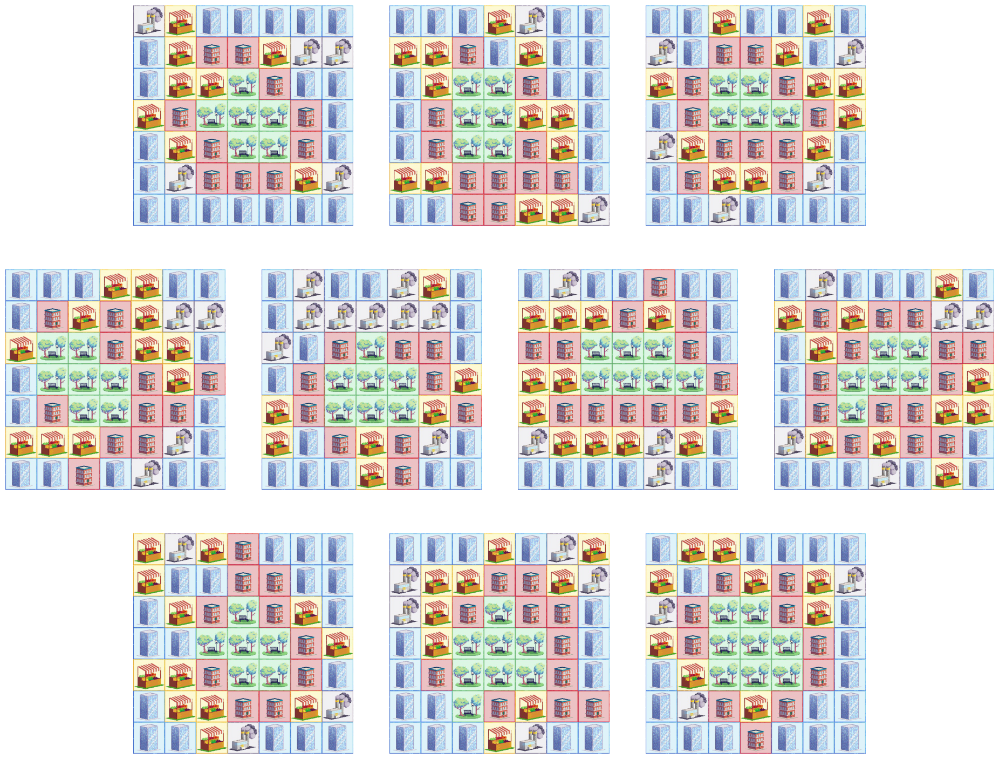

In [29]:
plot_n_grids(grids[top_100_indices][-10:])

### My Code (Spectral Clustering)

In [36]:
# Step 1: Import necessary libraries
from sklearn.cluster import SpectralClustering
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming all_train is your feature matrix
# Step 2: Apply Spectral Clustering
clustering = SpectralClustering(n_clusters=5, assign_labels="discretize", random_state=0).fit(all_train)
labels = clustering.labels_

# Step 3: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(all_train, labels, test_size=0.2, random_state=42)

# Step 4: Choose a model
clf = RandomForestClassifier()

# Step 5: Train the model
clf.fit(X_train, y_train)

# Step 6: Evaluate the model
y_pred = clf.predict(X_test)
print('Accuracy: ', accuracy_score(y_test, y_pred))

# Step 7: Make predictions
# Replace new_data with your actual new data
new_data = [[0.5, 0.5, 0.5, 0.5]]
print('Prediction: ', clf.predict(new_data))

C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\sklearn\utils\validation.py:1858: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['int', 'str']. An error will be raised in 1.2.
  warnings.warn(


### My Code (ChatGPT)

In [ ]:
#imports
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import numpy as np

In [ ]:

# Let's assume `df` is your DataFrame and it has been passed to this script
# df = ...
grids = load_grids()
grids.shape()
ratings = np.load("datasets/scores.npy") #Load advisor scores
ratings.shape()
score_order = ["Wellness", "Tax", "Transportation", "Business"] #This is the order of the scores in the dataset
ratings_df = pd.DataFrame(ratings, columns = score_order) #Create a dataframe
grids_subset, ratings_subset = select_rated_subset(grids, ratings)

In [ ]:

# Suppose your DataFrame looks like this:
# feature1, feature2, ..., featureN, score1, score2, score3, score4

# Aggregate the scores, here we take the minimum score to ensure high confidence
df['min_score'] = df[['score1', 'score2', 'score3', 'score4']].min(axis=1)

# Select features and target
X = df[['feature1', 'feature2', '...', 'featureN']]  # Replace '...' with actual feature names
y = df['min_score']

# Split the data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the model
model = RandomForestRegressor(random_state=42)

# Define a custom scorer that penalizes predictions below 0.85 more
def custom_scorer(y_true, y_pred):
    penalty = 100.0  # You can adjust this penalty
    mse = mean_squared_error(y_true, y_pred)
    under_threshold_penalty = np.mean([(0.85 - pred)**2 if pred < 0.85 else 0 for pred in y_pred])
    return mse + penalty * under_threshold_penalty

scorer = make_scorer(custom_scorer, greater_is_better=False)

# Define grid search parameters
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
    # Add more parameters here
}

# Perform grid search with custom scorer
grid_search = GridSearchCV(model, param_grid, cv=5, scoring=scorer)
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Predict on validation set
y_pred = best_model.predict(X_val)

# Select the top 100 points with the highest predicted min_score over 0.85
threshold = 0.85
selected_indices = np.where(y_pred > threshold)[0]
top_indices = selected_indices[np.argsort(y_pred[selected_indices])[-100:]]

# Retrieve the original data points corresponding to top indices
selected_points = df.iloc[top_indices]

# Since we only want 100 points, if we have more, we select the top 100 based on prediction
if len(selected_points) > 100:
    selected_points = selected_points.nlargest(100, 'min_score')

# Save or print the selected points
# selected_points.to_csv('selected_points.csv', index=False)  # Uncomment to save to a CSV
print(selected_points)


### Basic Runs

In [4]:
from utils_public import *
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from autogluon.tabular import TabularPredictor
grids = load_grids()
ratings = np.load("datasets/scores.npy") #Load advisor scores

### Other Fxns

In [2]:
def get_predictions(grids, ratings, predictor):
    grids = grids.reshape(grids.shape[0], 49)
    grids_df = pd.DataFrame(grids, columns = range(grids.shape[1]))
    predictions = predictor.predict(grids_df).values
    mask = np.where(~np.isnan(ratings)) # ~ is the bitwise NOT operator
    predictions[mask] = ratings[mask]
    return predictions

In [9]:
from sklearn.metrics import r2_score

def plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i):
    plt.scatter(ratings_train, preds_train, label='Train Set Preds', s=3, c = "#F08E18") #Train set in orange
    plt.scatter(ratings_test, preds_test, label='Test Set Preds', s=5, c = "#DC267F") #Test set in magenta
    plt.plot([0,1], [0,1], label="target", linewidth=3, c="k") # Target line in Black
    plt.xlabel("Actual Rating")
    plt.ylabel("Predicted Rating")
    plt.title(f"Advisor {i} Predictions")
    plt.legend()
    plt.show()
    print(f"Train Set R2 score: {r2_score(ratings_train, preds_train)}") #Calculate R2 score
    print(f"Test Set R2 score: {r2_score(ratings_test, preds_test)}")

### Changing Predictor (Autogluon Try #1)

In [12]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    # # Define the search space
    # hyperparameters = {
    #     'NN_TORCH': {'num_epochs': [10, 20, 30, 40, 50], 'learning_rate': [0.1, 0.05, 0.01, 0.005, 0.001]},
    #     'GBM': {'num_boost_round': [100, 200, 300, 400, 500], 'learning_rate': [0.1, 0.05, 0.01, 0.005, 0.001]},
    #     'RF': {'n_estimators': [100, 200, 300, 400, 500], 'max_depth': [None, 5, 10, 15, 20]},
    #     'XT': {'n_estimators': [100, 200, 300, 400, 500], 'max_depth': [None, 5, 10, 15, 20]},
    #     'KNN': {'n_neighbors': [3, 5, 7, 9, 11, 13]}
    # }

    # # Define the HPO algorithm
    # hpo_kwargs = {
    #     'num_trials': 100,
    #     'scheduler' : 'local',
    #     'searcher': 'random'
    # }

    # # Train the predictor
    # predictor = TabularPredictor(label="ratings").fit(
    #     all_train,
    #     hyperparameters=hyperparameters,
    #     hyperparameter_tune_kwargs=hpo_kwargs
    # )
    
    #change predictor definition
    predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
        'NN_TORCH':{'num_epochs':[50], 'learning_rate':[0.01]}, 
        'GBM':{'learning_rate':[0.01]}, 
        'RF':{}, 
        'XT':{}, 
        'KNN':{}
    })

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_011401\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_011401\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.45 GB / 510.77 GB (6.2%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49556, 0.28834)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	A

	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	2.0s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train Data (Processed) Memory Usage: 0.2 MB (0.0% of available memory)
Data preprocessing and feature engineering runtime = 2.11s ...
AutoGluon will gauge predictive performance using evaluation metric: 'root_mean_squared_error'
	This metric's sign has been flipped to adhere to being higher_is_better. The

[1000]	valid_set's rmse: 0.170269
[2000]	valid_set's rmse: 0.152111
[3000]	valid_set's rmse: 0.146275
[4000]	valid_set's rmse: 0.144647
[5000]	valid_set's rmse: 0.143991
[6000]	valid_set's rmse: 0.143703
[7000]	valid_set's rmse: 0.143576
[8000]	valid_set's rmse: 0.143598
[9000]	valid_set's rmse: 0.143628


	-0.1436	 = Validation score   (-root_mean_squared_error)
	51.09s	 = Training   runtime
	0.45s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2641	 = Validation score   (-root_mean_squared_error)
	4.99s	 = Training   runtime
	0.15s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2644	 = Validation score   (-root_mean_squared_error)
	3.75s	 = Training   runtime
	0.22s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

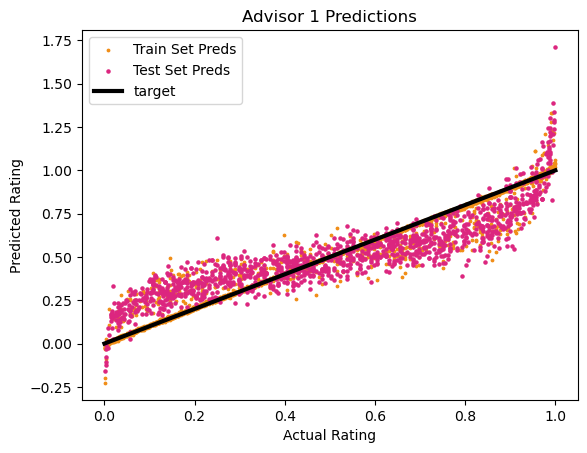

Train Set R2 score: 0.9664392189642175
Test Set R2 score: 0.774582964734774


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_011942\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_011942\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.27 GB / 510.77 GB (6.1%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.000642515014272003, 0.50178, 0.29128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

[1000]	valid_set's rmse: 0.255081
[2000]	valid_set's rmse: 0.251175
[3000]	valid_set's rmse: 0.248615
[4000]	valid_set's rmse: 0.247789


	-0.2476	 = Validation score   (-root_mean_squared_error)
	19.17s	 = Training   runtime
	0.13s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2746	 = Validation score   (-root_mean_squared_error)
	3.93s	 = Training   runtime
	0.14s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2773	 = Validation score   (-root_mean_squared_error)
	2.85s	 = Training   runtime
	0.14s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

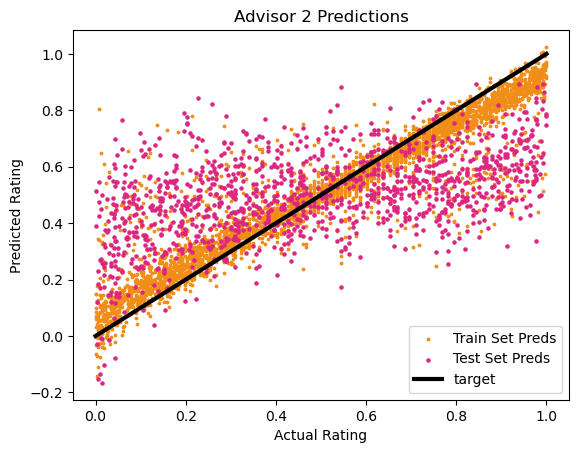

Train Set R2 score: 0.8736698461958492
Test Set R2 score: 0.24876035029312527


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_012140\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_012140\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   31.11 GB / 510.77 GB (6.1%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0009361947285035282, 0.50368, 0.28964)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	

[1000]	valid_set's rmse: 0.196859
[2000]	valid_set's rmse: 0.189621
[3000]	valid_set's rmse: 0.188261
[4000]	valid_set's rmse: 0.188033


	-0.1879	 = Validation score   (-root_mean_squared_error)
	17.58s	 = Training   runtime
	0.08s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2529	 = Validation score   (-root_mean_squared_error)
	4.02s	 = Training   runtime
	0.12s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2542	 = Validation score   (-root_mean_squared_error)
	2.55s	 = Training   runtime
	0.11s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

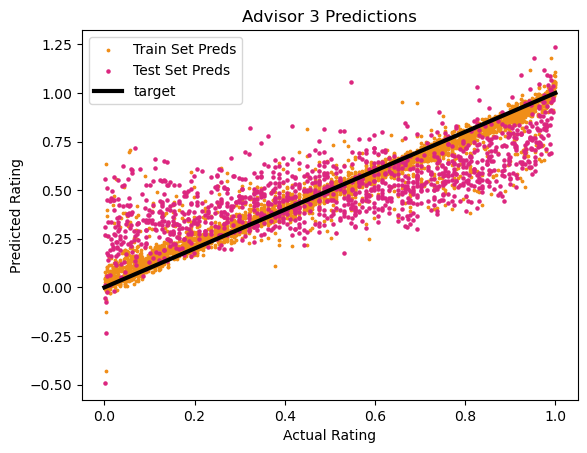

Train Set R2 score: 0.9292647153170748
Test Set R2 score: 0.5427812423517766


In [13]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(1,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_023706\"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels\ag-20231107_023706\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   30.90 GB / 510.77 GB (6.0%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.4857, 0.29229)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory

[1000]	valid_set's rmse: 0.202862
[2000]	valid_set's rmse: 0.190433
[3000]	valid_set's rmse: 0.186243
[4000]	valid_set's rmse: 0.185153
[5000]	valid_set's rmse: 0.184676
[6000]	valid_set's rmse: 0.184585
[7000]	valid_set's rmse: 0.184476
[8000]	valid_set's rmse: 0.184388
[9000]	valid_set's rmse: 0.184333
[10000]	valid_set's rmse: 0.184351


	-0.1843	 = Validation score   (-root_mean_squared_error)
	36.74s	 = Training   runtime
	0.66s	 = Validation runtime
Fitting model: RandomForest ...
	-0.2604	 = Validation score   (-root_mean_squared_error)
	4.27s	 = Training   runtime
	0.17s	 = Validation runtime
Fitting model: ExtraTrees ...
	-0.2604	 = Validation score   (-root_mean_squared_error)
	2.76s	 = Training   runtime
	0.17s	 = Validation runtime
Fitting model: NeuralNetTorch ...
		'<=' not supported between instances of 'float' and 'list'
Detailed Traceback:
Traceback (most recent call last):
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1733, in _train_and_save
    model = self._train_single(X, y, model, X_val, y_val, total_resources=total_resources, **model_fit_kwargs)
  File "C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\autogluon\core\trainer\abstract_trainer.py", line 1684, in _train_single
    model = model.fit(X=X, y=y, X_val=X_

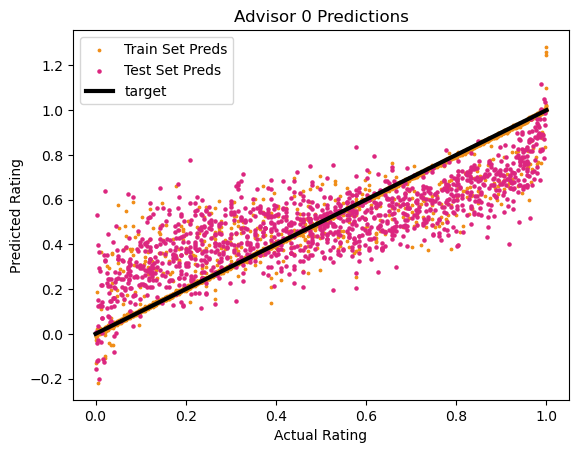

Train Set R2 score: 0.9467469040712199
Test Set R2 score: 0.6099731545086702


In [22]:
for i in range(1):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [24]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.8359293  0.98004997 0.963675   0.8073551 ]


In [27]:
diversity_score(final_submission)


0.53853638425067

### Neural Net (Autogluon)

In [34]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    from autogluon.common import space

    nn_options = {  # specifies non-default hyperparameter values for neural network models
        'num_epochs': 10,  # number of training epochs (controls training time of NN models)
        'learning_rate': space.Real(1e-4, 1e-2, default=5e-4, log=True),  # learning rate used in training (real-valued hyperparameter searched on log-scale)
        'activation': space.Categorical('relu', 'softrelu', 'tanh'),  # activation function used in NN (categorical hyperparameter, default = first entry)
        'dropout_prob': space.Real(0.0, 0.5, default=0.1),  # dropout probability (real-valued hyperparameter)
    }

    gbm_options = {  # specifies non-default hyperparameter values for lightGBM gradient boosted trees
        'num_boost_round': 100,  # number of boosting rounds (controls training time of GBM models)
        'num_leaves': space.Int(lower=26, upper=66, default=36),  # number of leaves in trees (integer hyperparameter)
    }

    hyperparameters = {  # hyperparameters of each model type
                    'GBM': gbm_options,
                    'NN_TORCH': nn_options,  # : comment this line out if you get errors on Mac OSX
                    }  # When these keys are missing from hyperparameters dict, no models of that type are trained

    time_limit = 2*60  # train various models for ~2 min
    num_trials = 5  # try at most 5 different hyperparameter configurations for each type of model
    search_strategy = 'auto'  # to tune hyperparameters using random search routine with a local scheduler

    hyperparameter_tune_kwargs = {  # HPO is not performed unless hyperparameter_tune_kwargs is specified
        'num_trials': num_trials,
        'scheduler' : 'local',
        'searcher': search_strategy,
    }  # Refer to TabularPredictor.fit docstring for all valid values

    predictor = TabularPredictor(label='ratings').fit(
        all_train,
        time_limit=time_limit,
        hyperparameters=hyperparameters,
        hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
    )
    # predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
    #     'NN_TORCH': {
    #     'num_epochs': 50,
    #     'learning_rate': 0.01,
    #     'activation': 'relu',
    #     'layers': [100, 100],
    #     'dropout_prob': 0.1
    # }})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171439\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171439\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0008403151805306168, 0.4857, 0.29229)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...


Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    5867.92 MB
	Train Data (Original)  Memory Usage: 5.88 MB (0.1% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	0.8s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train

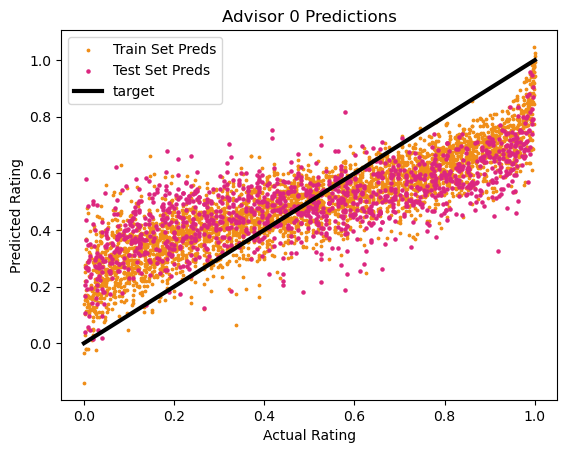

Train Set R2 score: 0.6728486586137394
Test Set R2 score: 0.4543869239505043


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171453\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171453\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49556, 0.28834)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeat

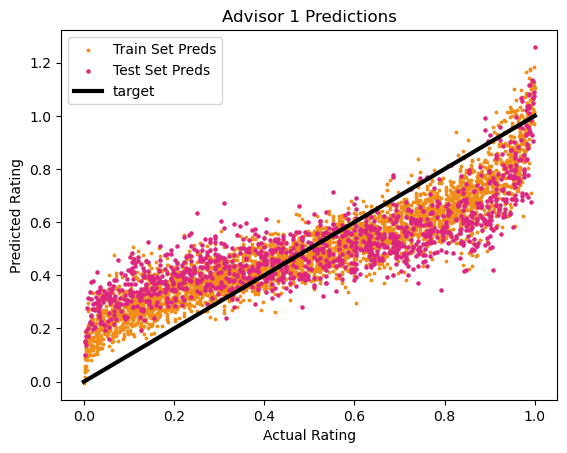

Train Set R2 score: 0.7836128230790711
Test Set R2 score: 0.5967596161119517


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171505\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171505\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.000642515014272003, 0.50178, 0.29128)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...

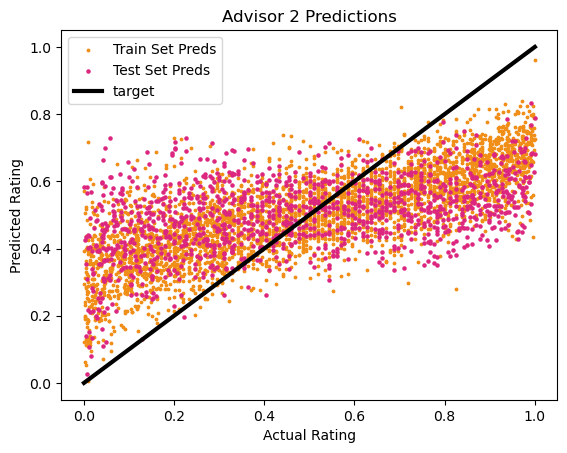

Train Set R2 score: 0.48553678495448604
Test Set R2 score: 0.1880950227595175


No path specified. Models will be saved in: "AutogluonModels\ag-20231107_171520\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231107_171520\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   28.89 GB / 510.77 GB (5.7%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0009361947285035282, 0.50368, 0.28964)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFea

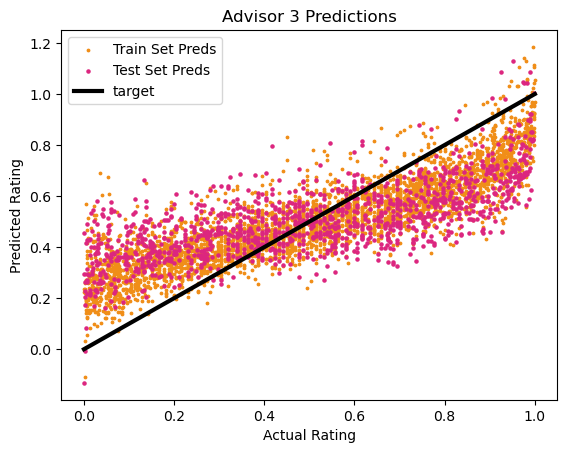

Train Set R2 score: 0.679653830412879
Test Set R2 score: 0.4541222671909998


In [35]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [42]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.8056193  0.80807453 0.7856792  0.83850324]


In [41]:
diversity_score(final_submission)

0.5350319521748094

### Neural Net Try 2 (Autogluon)

In [83]:
def fit_plot_predict(grids, ratings, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    all_train = pd.concat([grids_train, preds_train], axis=1)

    from autogluon.tabular import TabularPredictor

    from autogluon.common import space

    nn_options = {  # specifies non-default hyperparameter values for neural network models
        'num_epochs': 100,  # number of training epochs (controls training time of NN models)
        'learning_rate': space.Real(1e-4, 1e-2, default=5e-4, log=True),  # learning rate used in training (real-valued hyperparameter searched on log-scale)
        'activation': space.Categorical('relu', 'softrelu', 'tanh'),  # activation function used in NN (categorical hyperparameter, default = first entry)
        'dropout_prob': space.Real(0.0, 0.5, default=0.1),  # dropout probability (real-valued hyperparameter)
    }

    gbm_options = {  # specifies non-default hyperparameter values for lightGBM gradient boosted trees
        'num_boost_round': 100,  # number of boosting rounds (controls training time of GBM models)
        'num_leaves': space.Int(lower=26, upper=66, default=36),  # number of leaves in trees (integer hyperparameter)
    }

    hyperparameters = {  # hyperparameters of each model type
                    'GBM': gbm_options,
                    'NN_TORCH': nn_options,  # : comment this line out if you get errors on Mac OSX
                    }  # When these keys are missing from hyperparameters dict, no models of that type are trained

    time_limit = 2*60  # train various models for ~2 min
    num_trials = 15  # try at most 5 different hyperparameter configurations for each type of model
    search_strategy = 'auto'  # to tune hyperparameters using random search routine with a local scheduler

    hyperparameter_tune_kwargs = {  # HPO is not performed unless hyperparameter_tune_kwargs is specified
        'num_trials': num_trials,
        'scheduler' : 'local',
        'searcher': search_strategy,
    }  # Refer to TabularPredictor.fit docstring for all valid values

    predictor = TabularPredictor(label='ratings').fit(
        all_train,
        time_limit=time_limit,
        hyperparameters=hyperparameters,
        hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
    )
    # predictor = TabularPredictor(label="ratings").fit(all_train, hyperparameters = {
    #     'NN_TORCH': {
    #     'num_epochs': 50,
    #     'learning_rate': 0.01,
    #     'activation': 'relu',
    #     'layers': [100, 100],
    #     'dropout_prob': 0.1
    # }})

    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
    predictions = get_predictions(grids, ratings[:,i], predictor)
    return predictions, predictor

No path specified. Models will be saved in: "AutogluonModels\ag-20231112_153032\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231112_153032\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   27.35 GB / 510.77 GB (5.4%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0009516922667730555, 0.48683, 0.29167)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator..

	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting CategoryFeatureGenerator...
			Fitting CategoryMemoryMinimizeFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	Stage 5 Generators:
		Fitting DropDuplicatesFeatureGenerator...
	Types of features in original data (raw dtype, special dtypes):
		('object', []) : 49 | ['0', '1', '2', '3', '4', ...]
	Types of features in processed data (raw dtype, special dtypes):
		('category', []) : 49 | ['0', '1', '2', '3', '4', ...]
	2.5s = Fit runtime
	49 features in original data used to generate 49 features in processed data.
	Train Data (Processed) Memory Usage: 0.2 MB (0.0% of available memory)
Data preprocessing and feature engineering runtime = 2.61s ...
AutoGluon will gauge predictive performance using evaluation metric: 'root_mean_squared_error'
	This metric's sign has been flipped to adhere to being higher_is_better. The

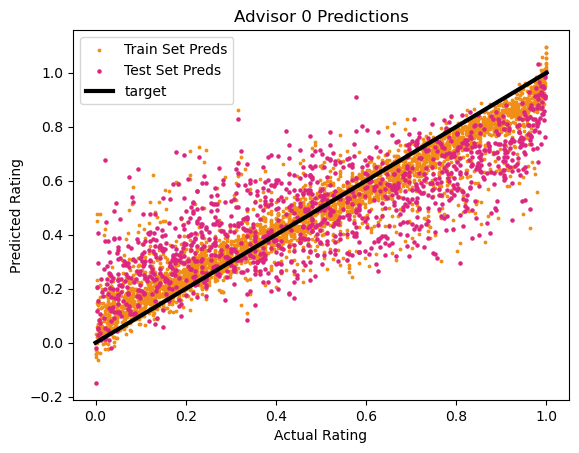

Train Set R2 score: 0.8872457125311428
Test Set R2 score: 0.6221322575448487


No path specified. Models will be saved in: "AutogluonModels\ag-20231112_153226\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231112_153226\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   27.34 GB / 510.77 GB (5.4%)
Train Data Rows:    3748
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9995316910443931, 0.000898500117417629, 0.49882, 0.28989)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeat

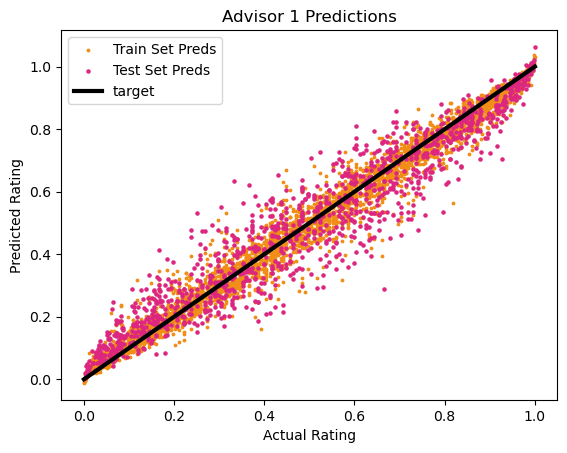

Train Set R2 score: 0.9771045098960485
Test Set R2 score: 0.9168250622510079


No path specified. Models will be saved in: "AutogluonModels\ag-20231112_155330\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231112_155330\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   27.33 GB / 510.77 GB (5.4%)
Train Data Rows:    3749
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (1.0, 0.0006338748368184672, 0.49644, 0.29199)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator..

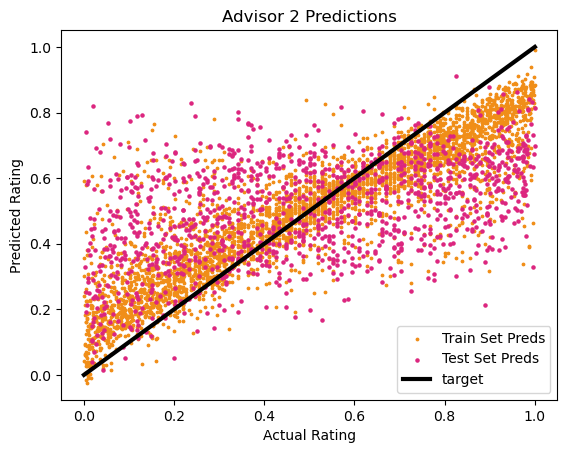

Train Set R2 score: 0.7525369512620971
Test Set R2 score: 0.22374763120591634


No path specified. Models will be saved in: "AutogluonModels\ag-20231112_155531\"
Beginning AutoGluon training ... Time limit = 120s
AutoGluon will save models to "AutogluonModels\ag-20231112_155531\"
AutoGluon Version:  0.8.2
Python Version:     3.10.13
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.19045
Disk Space Avail:   27.30 GB / 510.77 GB (5.3%)
Train Data Rows:    3750
Train Data Columns: 49
Label Column: ratings
Preprocessing data ...
AutoGluon infers your prediction problem is: 'regression' (because dtype of label-column == float and many unique label-values observed).
	Label info (max, min, mean, stddev): (0.9993096973713276, 0.0005841214972714321, 0.49965, 0.29098)
	If 'regression' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFea

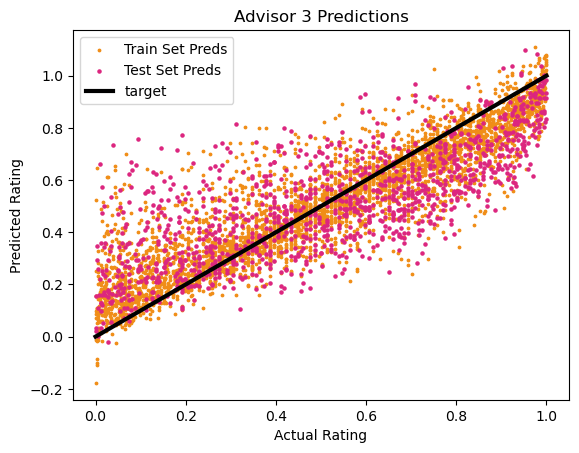

Train Set R2 score: 0.8056776148528638
Test Set R2 score: 0.5651257059184747


In [86]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = fit_plot_predict(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

In [87]:
#determine what the 100 grid scores resulted in
final_prediction_array = np.stack(all_predictions).T
min_predictions = np.min(final_prediction_array, axis=1)
print(f"Number of valid grids (as predicted): {np.sum(min_predictions>0.85)}")
print(f"best predicted scores: {final_prediction_array[np.argmax(min_predictions)]}")
top_100_indices = np.argpartition(min_predictions, -100)[-100:] #indices of top 100 designs (as sorted by minimum advisor score)

Number of valid grids (as predicted): 0
best predicted scores: [0.8497037  0.8607934  0.90944326 0.8488045 ]


In [47]:
diversity_score(final_submission)

0.5350319521748094

### Run Old Autogluon Models

In [28]:
grids = load_grids() #load the grids
ratings = np.load("datasets/scores.npy") #load the ratings

In [29]:
def auto_run(predictor, grids_train, grids_test, ratings_train, ratings_test, i):
    preds_test = predictor.predict(grids_test)
    preds_train = predictor.predict(grids_train)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)

In [ ]:
cwd = os.getcwd()
for i in range(4):
    f = os.path.join(cwd, 'AutogluonModels', '%d'%i)
    files = os.listdir(f)
    print(files)
    for j in files:
        direc="AutogluonModels/%d/%s/"%(i,j)
        print(direc)
        predictor = TabularPredictor.load(direc) #load the predictor
        # all_predictions = []
        grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
        grids_subset = grids_subset.reshape(grids_subset.shape[0], 49) #flatten the grids
        grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
        grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
        grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
        auto_run(predictor, grids_train, grids_test, ratings_train, ratings_test, i)
        # predictions = get_predictions(grids, ratings[:,i], predictor)
        # all_predictions.append(predictions)



### Neural Net (Pytorch)

In [33]:
#imports
import torch
import torch.nn as nn
import torch.optim as optim
import transformers
from transformers import AutoConfig
from torch.utils.data import DataLoader, TensorDataset
import sklearn


In [35]:
def nn_torch(grids, results, adv):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,adv]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
    # gridy=grids_subset.reshape(-1, 7, 7)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

    # Split into features and labels
    X_train = grids_train  # all columns except the last one
    y_train = ratings_train  # the last column

    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float)

    # Create a TensorDataset from the tensors
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

    # Create a DataLoader from the TensorDataset
    trainloader = DataLoader(train_dataset, batch_size=100, shuffle=True)

    # Define the network architecture
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(49, 25)  # 49 input features, 25 output features
            self.fc2 = nn.Linear(25, 13)  
            self.fc3 = nn.Linear(13, 1) 
            self.activation = nn.Sigmoid()
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = self.fc3(x)
            x = self.activation(x)
            return x

    # Create the network, loss function and optimizer
    net = Net() # Create the network
    net.train() # Set the network to training mode
    criterion = nn.MSELoss()  # For regression tasks
    optimizer = optim.AdamW(net.parameters(), lr=0.1)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, 
                                                     min_lr=1e-10,
                                                     verbose=True) # Reduce learning rate when a metric has stopped improving
    
    
    # Train the network
    for epoch in range(100):  # Loop over the dataset multiple times
        running_loss = 0.0 # Keep track of the loss
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data # Get the inputs from the data loader
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            scheduler.step(loss)
            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # # Create a TensorDataset from the tensors
    # test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # # Create a DataLoader from the TensorDataset
    # testloader = DataLoader(test_dataset, batch_size=100)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    preds_test = np.array(net(X_test_tensor).detach().numpy())
    preds_train = np.array(net(X_train_tensor).detach().numpy())

    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, adv)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

In [73]:
def nn_torch_new(grids, ratings, n):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,n]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.tensor(grids_train, dtype=torch.float)
    y_train_tensor = torch.tensor(ratings_train, dtype=torch.float)

    # Create a TensorDataset from the tensors
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

    # Create a DataLoader from the TensorDataset
    trainloader = DataLoader(train_dataset, batch_size=500, shuffle=True)

    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(grids_subset.shape[1], 25)  # 49 is the number of neurons in the hidden layer
            self.fc2 = nn.Linear(25, 1)  # 1 is the number of output features
            self.activation = nn.Sigmoid()
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = self.fc2(x)
            x = self.activation(x)
            return x

    net = Net()
    criterion = nn.MSELoss()  # For regression tasks
    optimizer = optim.SGD(net.parameters(), lr=0.0001)
    for epoch in range(100):  # Number of epochs
        for inputs, labels in trainloader:
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()   

    # Assuming X_test and y_test are your test data
    X_test_tensor = torch.tensor(grids_test, dtype=torch.float)
    y_test_tensor = torch.tensor(ratings_test, dtype=torch.float)

    outputs = net(X_test_tensor)
    loss = criterion(outputs, y_test_tensor)
    print('Test loss:', loss.item())

    preds_train = net(X_train_tensor).detach().numpy()
    preds_test = net(X_test_tensor).detach().numpy()

    return preds_train, preds_test, ratings_train, ratings_test, net

In [54]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,n]) #gets subset of the dataset rated by advisor 0
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
grids_subset.shape[1]

49

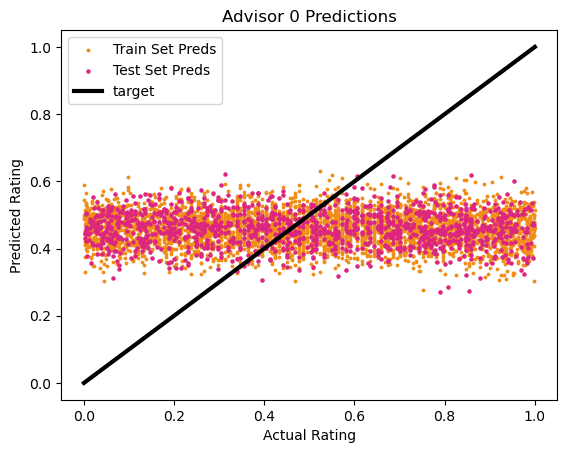

Train Set R2 score: -0.07155510153569655
Test Set R2 score: -0.06047443976270639


In [58]:
plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, 0)

In [44]:
def get_predictions(grids, ratings, net):
    grids = grids.reshape(grids.shape[0], 49)
    X_test_tensor = torch.tensor(grids, dtype=torch.float)
    predictions = net(X_test_tensor).detach().numpy().flatten()
    print(predictions.shape)
    print(ratings.shape)
    mask = np.where(~np.isnan(ratings))
    predictions[mask] = ratings[mask]
    return predictions.reshape(-1,1)

C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([500])) that is different to the input size (torch.Size([500, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([249])) that is different to the input size (torch.Size([249, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([1250])) that is different to the input size (torch.Size([1250, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Test loss: 0.09692946821451187


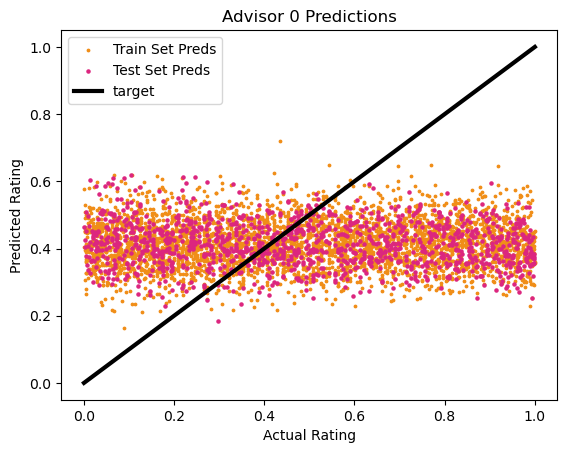

Train Set R2 score: -0.1074093819448283
Test Set R2 score: -0.16200340559550508
(500000,)
(500000,)


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([500])) that is different to the input size (torch.Size([500, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([248])) that is different to the input size (torch.Size([248, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


KeyboardInterrupt: 

In [74]:
#run code for all advisors
all_predictions = []
all_predictors = []
for n in range(4):
    preds_train, preds_test,ratings_train, ratings_test, net = nn_torch_new(grids, ratings, n)
    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, n)
    all_predictions.append(get_predictions(grids, ratings[:,n], net))
    # all_predictors.append(predictor)

In [141]:
grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)
# gridy=grids_subset.reshape(-1, 7, 7)

grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)

# Split into features and labels
X_train = grids_train  # all columns except the last one
y_train = ratings_train  # the last column

# Convert numpy arrays to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float)
y_train_tensor = torch.tensor(y_train, dtype=torch.float)

# Create a TensorDataset from the tensors
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

# Create a DataLoader from the TensorDataset
trainloader = DataLoader(train_dataset, batch_size=10, shuffle=True)


In [ ]:
# Define the network architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(49, 25)  # 49 input features, 25 output features
        self.fc2 = nn.Linear(25, 13)  
        self.fc3 = nn.Linear(13, 1) 
        self.activation = nn.Sigmoid()
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        x = self.activation(x)
        return x

# Create the network, loss function and optimizer
net = Net() # Create the network
criterion = nn.MSELoss()  # For regression tasks
optimizer = optim.AdamW(net.parameters(), lr=0.1)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=10, 
                                                    min_lr=1e-10,
                                                    verbose=True) # Reduce learning rate when a metric has stopped improving

param_grid={
    batch_size: [10, 20, 30, 40, 50]}

def nn_torch(grids, results, i):
    # Train the network
    net.train() # Set the network to training mode

    for epoch in range(100):  # Loop over the dataset multiple times
        running_loss = 0.0 # Keep track of the loss
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data # Get the inputs from the data loader
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            scheduler.step(loss)
            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # Create a TensorDataset from the tensors
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # Create a DataLoader from the TensorDataset
    testloader = DataLoader(test_dataset, batch_size=1000)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    preds_test = np.array(net(X_test_tensor).detach().numpy())
    preds_train = np.array(net(X_train_tensor).detach().numpy())

    # plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

In [136]:
#run code for all advisors
all_predictions = []
all_predictors = []
for i in range(0,4):
    predictions, predictor = nn_torch(grids, ratings, i)
    all_predictions.append(predictions)
    all_predictors.append(predictor)

C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([10])) that is different to the input size (torch.Size([10, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 00020: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00037: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00048: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00067: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00078: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00089: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00100: reducing learning rate of group 0 to 1.0000e-08.


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([9])) that is different to the input size (torch.Size([9, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 100, loss: 0.08482266555229823
Finished Training
Epoch 00016: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00027: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00038: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00049: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00060: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00071: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00082: reducing learning rate of group 0 to 1.0000e-08.


C:\Users\layal\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\loss.py:535: UserWarning: Using a target size (torch.Size([8])) that is different to the input size (torch.Size([8, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch 100, loss: 0.08748111813267072
Finished Training
Epoch 00016: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00027: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00055: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00066: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00077: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00088: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00099: reducing learning rate of group 0 to 1.0000e-08.
Epoch 100, loss: 0.08684923146168391
Finished Training
Epoch 00018: reducing learning rate of group 0 to 1.0000e-02.
Epoch 00041: reducing learning rate of group 0 to 1.0000e-03.
Epoch 00052: reducing learning rate of group 0 to 1.0000e-04.
Epoch 00063: reducing learning rate of group 0 to 1.0000e-05.
Epoch 00074: reducing learning rate of group 0 to 1.0000e-06.
Epoch 00085: reducing learning rate of group 0 to 1.0000e-07.
Epoch 00101: reducing learning rate of group 0 to 1.0000e-08.
Epoch 100, loss: 0.086

In [ ]:
def nn_torch(grids, results, i):
    grids_subset, ratings_subset = select_rated_subset(grids, ratings[:,i]) #gets subset of the dataset rated by advisor 0
    grids_subset = grids_subset.reshape(grids_subset.shape[0], 49)

    grids_train, grids_test, ratings_train, ratings_test = train_test_split(grids_subset, ratings_subset)
    # grids_train = pd.DataFrame(grids_train, columns = range(grids_subset.shape[1]), dtype = "object") #specify dtype of object to ensure categorical handling of data
    # grids_test = pd.DataFrame(grids_test, columns = range(grids_subset.shape[1]), dtype = "object")
    # preds_train = pd.DataFrame(ratings_train, columns = ["ratings"])
    # all_train = pd.concat([grids_train, preds_train], axis=1)
    
    # Convert DataFrame to numpy array
    # numpy_array = all_train.values

    # Split into features and labels
    X_train = grids_train  # all columns except the last one
    y_train = ratings_train  # the last column

    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float)

    # Create a TensorDataset from the tensors
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)

    # Create a DataLoader from the TensorDataset
    trainloader = DataLoader(train_dataset, batch_size=1000, shuffle=True)

    # Define the network architecture
    class Net(nn.Module):
        def __init__(self):
            super(Net, self).__init__()
            self.fc1 = nn.Linear(49, 25)  # Replace 16 with the number of input features
            self.fc2 = nn.Linear(25, 1)  # Replace 1 with the number of output features
            self.activation = nn.Sigmoid()
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = self.fc2(x)
            x = self.activation(x)
            return x

    # Create the network, loss function and optimizer
    net = Net()
    net.train()
    criterion = nn.MSELoss()  # For regression tasks
    # optimizer = optim.SGD(net.parameters(), lr=0.001)
    optimizer = optim.Adam(net.parameters(), lr=1e-3)
    # Train the network
    for epoch in range(10):  # Loop over the dataset multiple times
        running_loss = 0.0
        for i, data in enumerate(trainloader, 0):  # Replace trainloader with your actual data loader
            inputs, labels = data

            optimizer.zero_grad()
            
            outputs = net(inputs)
            # print(outputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
    print(f'Epoch {epoch + 1}, loss: {running_loss / len(trainloader)}')
    # preds_train=[]
    # preds_train.extend(outputs.detach().numpy())
    # preds_train = np.array(preds_train)
    preds_train = np.array(outputs.detach().numpy())
    # Assuming grids_test and ratings_test are your test data
    X_test = grids_test
    y_test = ratings_test

    # Convert numpy arrays to PyTorch tensors
    X_test_tensor = torch.tensor(X_test, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float)

    # Create a TensorDataset from the tensors
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

    # Create a DataLoader from the TensorDataset
    testloader = DataLoader(test_dataset, batch_size=1000)

    # Run the network on the test data and store the predictions
    # preds_test = []
    net.eval()
    for data in testloader:
        inputs, labels = data
        outputs = net(inputs)
        # preds_test.extend(outputs.detach().numpy())
        preds_test =

    # Convert list to numpy array
    preds_test = np.array(preds_test)

    # Run the network on the train data and store the predictions
    preds_train = []
    for data in testloader:
        inputs, labels = data
        outputs = net(inputs)
        preds_train.extend(outputs.detach().numpy())

    # Convert list to numpy array
    preds_train = np.array(preds_train)

    plot_and_r2(preds_train, preds_test, ratings_train, ratings_test, i)
        
    print('Finished Training')
    return preds_test, net #predictions for the test set

If you trained strong regressors, you should likely see that the dataset is much better performing, compared to random sampling. While the VAE may not generate quite as strong-performing designs as the dataset on average, it should generate better designs than the random sampler. Note: these observatons may not be apparant with a weak regressor.